In [1]:
import yaml
import astropy.units as u
import numpy as np
import matplotlib.pyplot as plt
from SimBMVtool import SimBMVtool as sim

datasets_path = '/fefs/aswg/workspace/marie-sophie.carrasco/projects/analysis/simulation/outputs/tests/data/datasets'

bkg_shape = 'elliptical_bkg_x_0_y_0_sig_03_phi_0_e_0_xgrad_0_ygrad_0'
obs_type = 'n_run_obs_per_wobble'
suffix = 'delay_600_norm_100_20240830'

# path_config = f'{datasets_path}/{bkg_shape}/{obs_type}_{suffix}/config_simu.yaml'
path_config = './config_simu.yaml'

paths: {'irf': '/fefs/aswg/workspace/marie-sophie.carrasco/projects/analysis/simulation/ressources/size_200_leakage_0.2_gammaness_eff60_ebins_5pdec_diffuse', 'gammapy_catalog': '/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy-extra/datasets/catalogs/gammacat/gammacat.fits.gz', 'output_dir': './outputs', 'simulated_obs_dir': '/fefs/aswg/workspace/marie-sophie.carrasco/projects/analysis/simulation/outputs/tests/data/datasets', 'save_name_obs': 'elliptical_bkg_x_0_y_0_sig_03_phi_0_e_0_xgrad_0_ygrad_0', 'save_name_suffix': 'delay_600_norm_100_20240830'}
simulation: {'simulate': False, 'n_run': 6, 'livetime': 600, 'single_pointing': False, 'obs_collection_type': 'n_run_obs_per_wobble', 't_ref': '2024-10-05 23:00:00', 'delay': 600, 'time_oversampling': 300, 'fov_rotation_error_limit': 1, 'e_min': 0.5, 'e_max': 10}
wobble_1: {'run': 11895, 'seed': 4, 'obs_id': '1'}
wobble_2: {'run': 11896, 'seed': 42, 'obs_id': '2'}
source: {'catalog_name': 'Crab nebula', 'flux_to_0': T

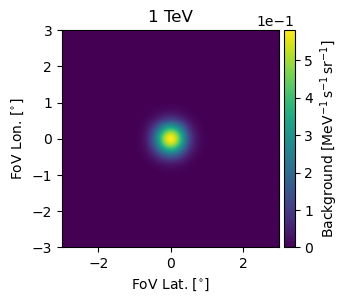

Obs collection loading pattern: obs_*elliptical_bkg_x_0_y_0_sig_03_phi_0_e_0_xgrad_0_ygrad_0.fits


INFO:gammapy.data.data_store:Observations selected: 12 out of 12.


Available sources:    OBJECT  
----------
model-simu
12 available runs:  [ 1  2  3  4  5  6  7  8  9 10 11 12]
Total simulated livetime: 2.0 h
FoV background method is applied
mu =  -0.13826842828495528  std=  0.9269991312006117
Ring background method is applied


/fefs/aswg/workspace/marie-sophie.carrasco/miniconda3/envs/SimBMVtool/lib/python3.11/site-packages/gammapy/stats/counts_statistic.py:399: RuntimeWarning: invalid value encountered in multiply
  return self.alpha * self.n_off
/fefs/aswg/workspace/marie-sophie.carrasco/miniconda3/envs/SimBMVtool/lib/python3.11/site-packages/gammapy/stats/fit_statistics.py:208: RuntimeWarning: invalid value encountered in multiply
  C = alpha * (n_on + n_off) - (1 + alpha) * mu_sig
/fefs/aswg/workspace/marie-sophie.carrasco/miniconda3/envs/SimBMVtool/lib/python3.11/site-packages/gammapy/stats/fit_statistics.py:209: RuntimeWarning: invalid value encountered in multiply
  D = np.sqrt(C**2 + 4 * alpha * (alpha + 1) * n_off * mu_sig)


mu =  -0.07187854545233599  std=  0.9106334812894556


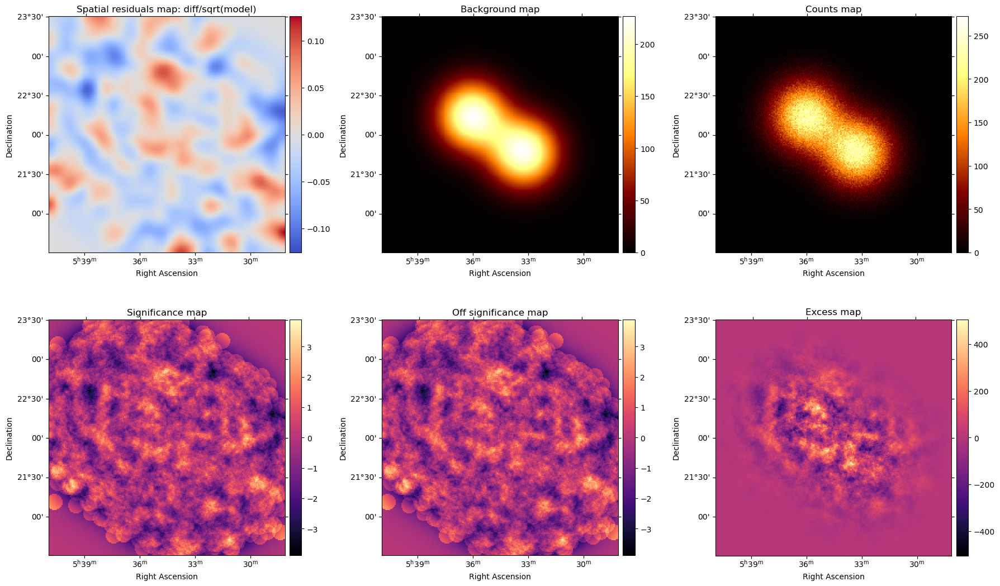

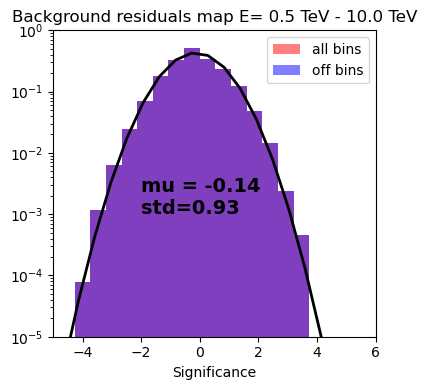

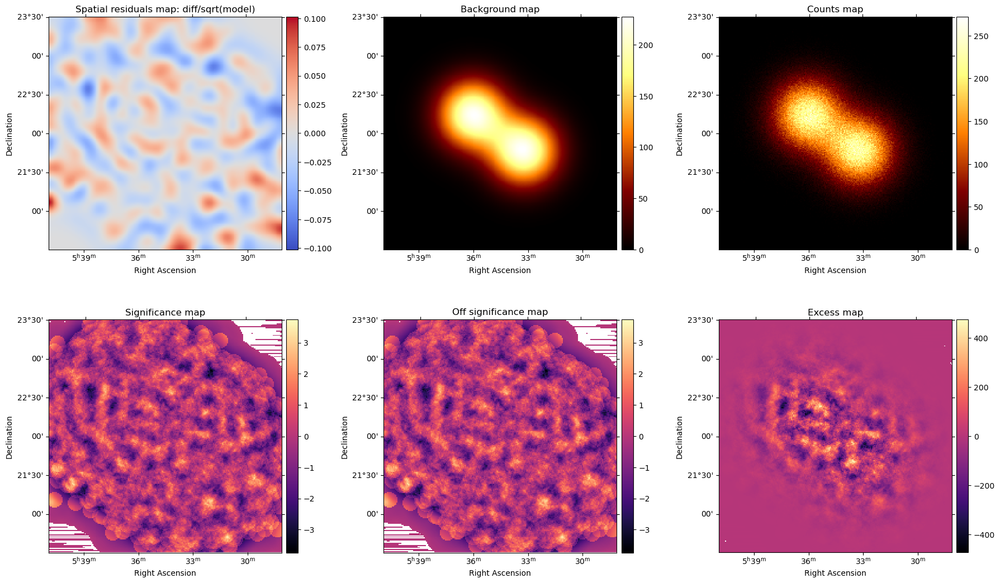

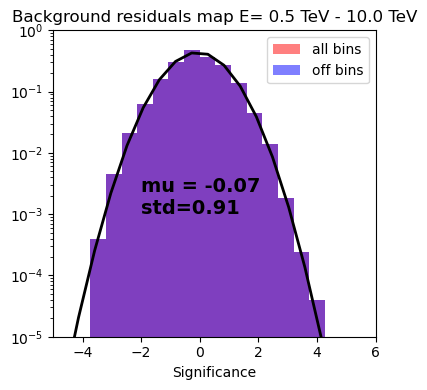

In [2]:
accmodel = sim.BaseSimBMVCreator()
accmodel.load_true_background_irfs(path_config) 

# Create temporary config file for notebook tests
path_tmp_config = f'{accmodel.save_path_simu}/tmp_config_simu.yaml'
with open(path_config, 'r') as file: tmp_config = yaml.safe_load(file)

# If you want to get the gammapy BackgroundIRF without knowing the name of the variables
true = accmodel.get_background_irf(type='true',downsampled=False) 
true_down = accmodel.get_background_irf(type='true',downsampled=True) 
true.plot_at_energy(["1 TeV"],figsize=(3,3))
plt.show()

plot_stacked_dataset_simu = True
axis_info = [accmodel.e_min,accmodel.e_max,3*u.deg,accmodel.nbin_offset_irf]
if plot_stacked_dataset_simu:
    accmodel.load_observation_collection()
    stacked_dataset_simu_W1_W2 = accmodel.get_stacked_dataset(bkg_method='FoV', axis_info=axis_info)
    sim.plot_lima_maps(stacked_dataset_simu_W1_W2, accmodel.ring_bkg_param[0],accmodel.source_pos,accmodel.exclude_regions,accmodel.exclu_rad,'',None,axis_info[:-1],cutout=True)
    stacked_dataset_simu_W1_W2 = accmodel.get_stacked_dataset(bkg_method='ring', axis_info=axis_info)
    sim.plot_lima_maps(stacked_dataset_simu_W1_W2, accmodel.ring_bkg_param[0],accmodel.source_pos,accmodel.exclude_regions,accmodel.exclu_rad,'',None,axis_info[:-1],cutout=True)

/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/irf/background.py:476: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale("log")


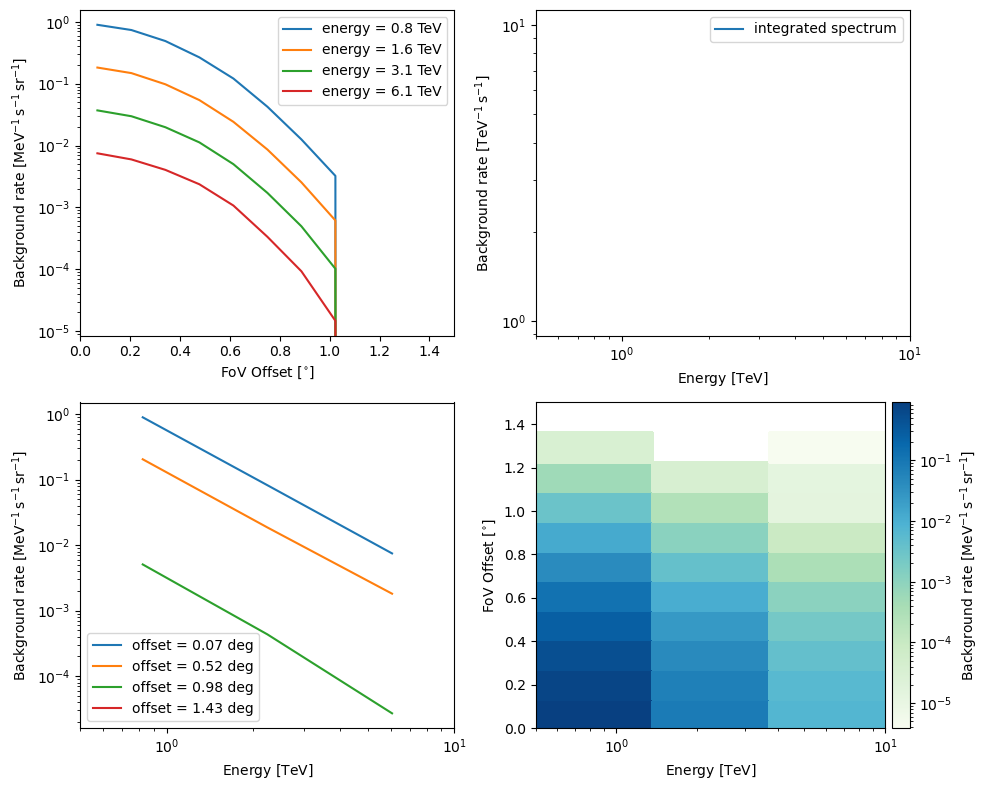

In [17]:
pybkgmodel.bkg_output_irf.peek()

paths: {'irf': '/fefs/aswg/workspace/marie-sophie.carrasco/projects/analysis/simulation/ressources/size_200_leakage_0.2_gammaness_eff60_ebins_5pdec_diffuse', 'gammapy_catalog': '/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy-extra/datasets/catalogs/gammacat/gammacat.fits.gz', 'output_dir': './outputs', 'simulated_obs_dir': '/fefs/aswg/workspace/marie-sophie.carrasco/projects/analysis/simulation/outputs/tests/data/datasets', 'save_name_obs': 'elliptical_bkg_x_0_y_0_sig_03_phi_0_e_0_xgrad_0_ygrad_0', 'save_name_suffix': 'delay_600_norm_100_20240830'}
simulation: {'simulate': False, 'n_run': 6, 'livetime': 600, 'single_pointing': False, 'obs_collection_type': 'n_run_obs_per_wobble', 't_ref': '2024-10-05 23:00:00', 'delay': 600, 'time_oversampling': 300, 'fov_rotation_error_limit': 1, 'e_min': 0.5, 'e_max': 10}
wobble_1: {'run': 11895, 'seed': 4, 'obs_id': '1'}
wobble_2: {'run': 11896, 'seed': 42, 'obs_id': '2'}
source: {'catalog_name': 'Crab nebula', 'flux_to_0': T

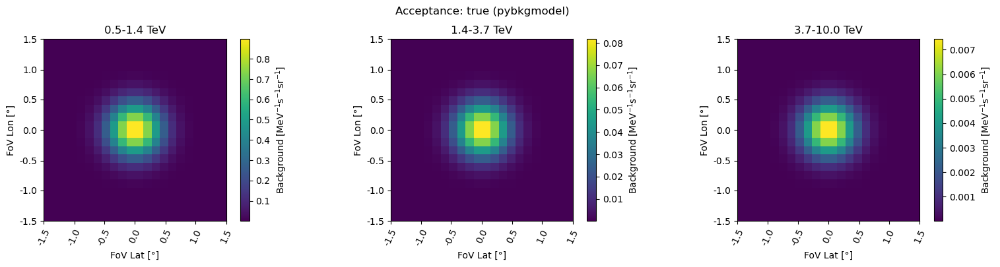

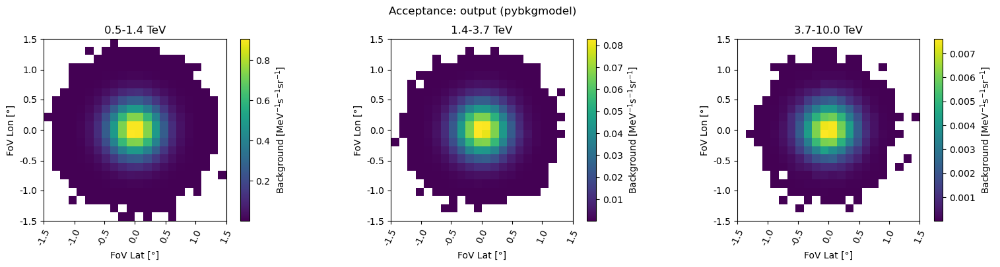

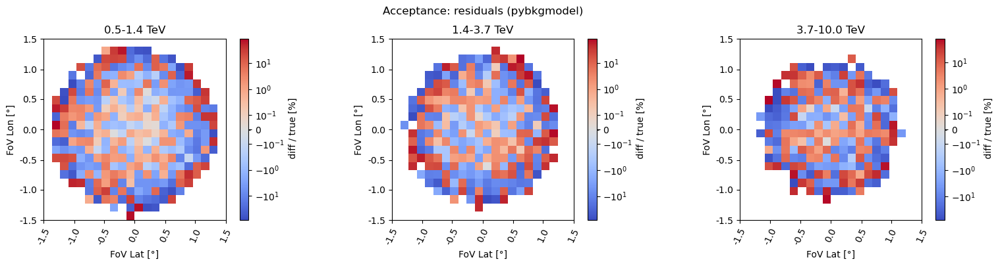

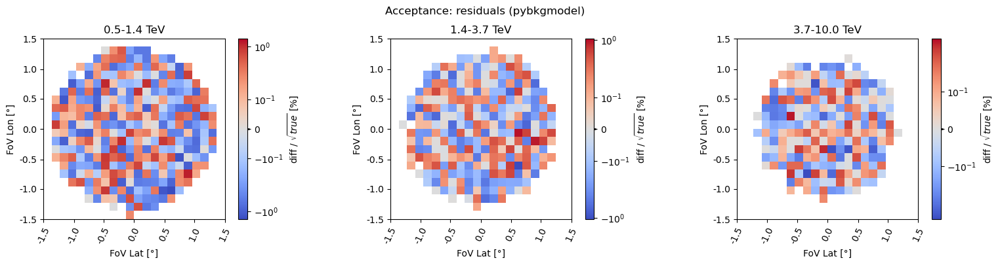

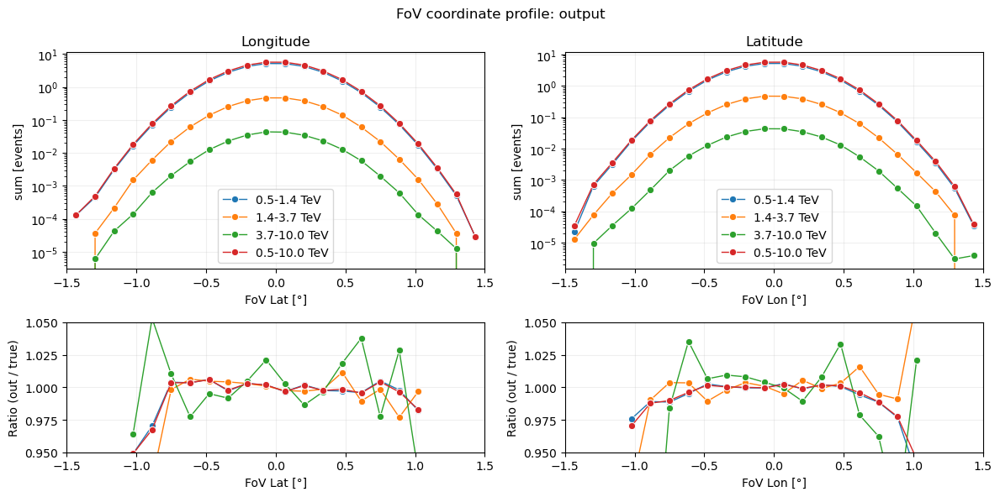

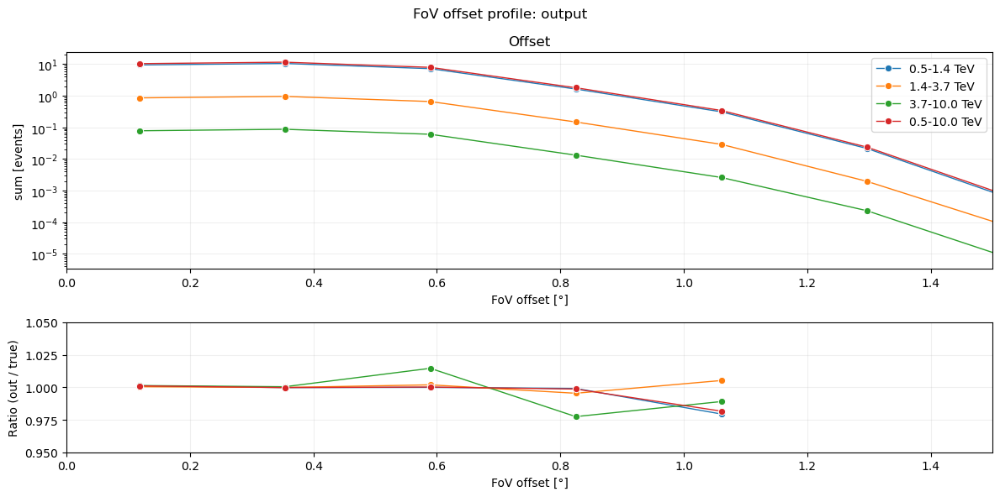

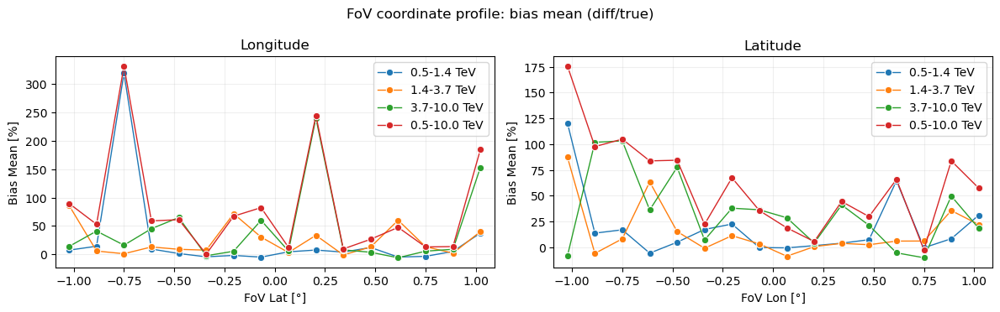

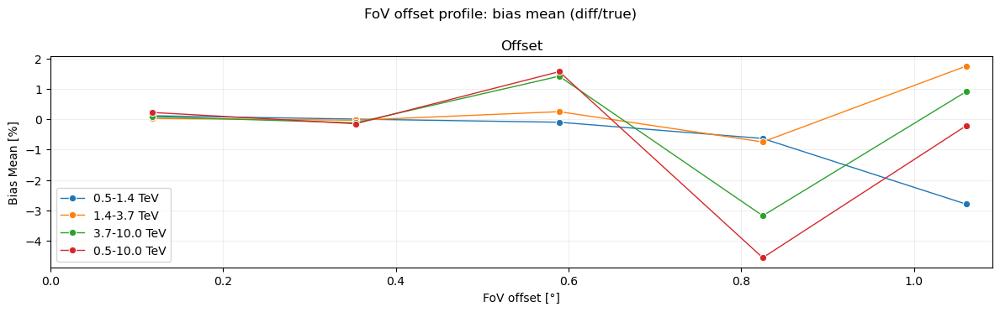

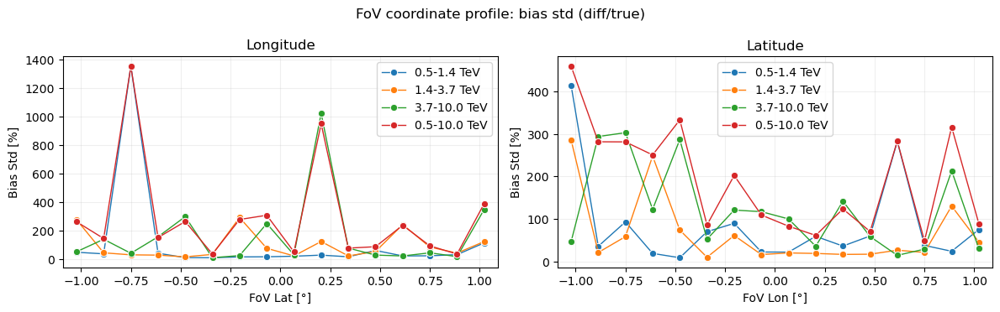

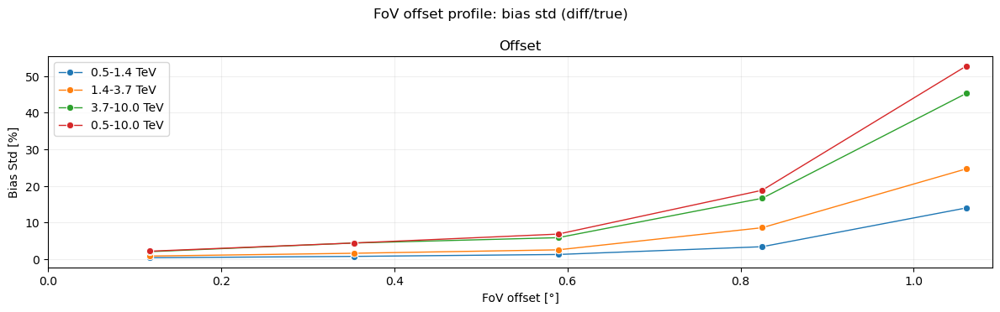

/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/data/pointing.py:157: GammapyDeprecationWarning: Passing mode is deprecated and the argument will be removed in Gammapy 1.3. pointing mode is deduced from whether fixed_icrs or fixed_altaz is given
  warnings.warn(


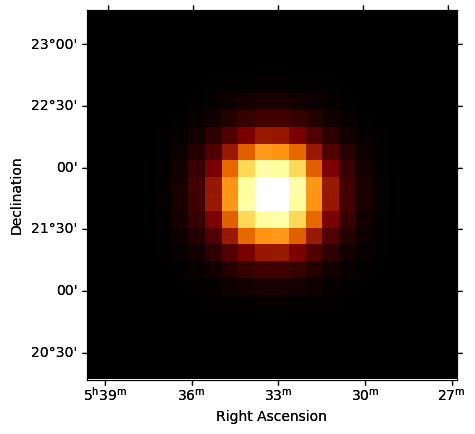

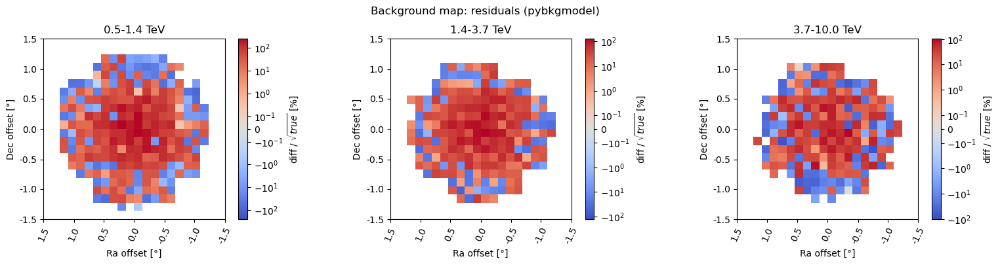

In [9]:
ali_dir = '/fefs/aswg/workspace/ali.baktash/simulation_data'
ellipse_in_corner = f'{ali_dir}/ellipse_in_corner'
gaussian_shifted_center =f'{ali_dir}/gaussian_shifted_center'
gaussian_one_sided = f'{ali_dir}/gaussian_one_sided'
gaussian_one_sided_radec = f'{ali_dir}/half_gaussian_RaDec'
gaussian_full = f'{ali_dir}/centered_full_gaussian'

path_acc_pybkgmodel = gaussian_full + '/no_exlcusion/teststacked_exclusion_map.fits'

pybkgmodel = sim.BaseSimBMVCreator()
pybkgmodel.load_true_background_irfs(path_config)
pybkgmodel.index_suffix = '_pybkgmodel'

pybkgmodel.save_path_simu = 'path to files'
pybkgmodel.out_collection = False # If set to false it will load the IRF with path given in config file for single_file_path

# Uncomment if you want to give another path to pybkgmodel output
# file_path ='/fefs/aswg/workspace/ali.baktash/simulation_data/centered_full_gaussian/no_exlcusion/teststacked_exclusion_map.fits'
#pybkgmodel.single_file_path = file_path
pybkgmodel.write_datastore_with_new_model(model_path=pybkgmodel.single_file_path)

do_model = False
if do_model: pybkgmodel.do_acceptance_modelisation()
else: pybkgmodel.load_output_background_irfs()


# if pybkgmodel.out_collection: pybkgmodel.bkg_output_irf_collection[1].plot_at_energy(["1 TeV"],figsize=(3,3))
# else: 
    # pybkgmodel.bkg_output_irf.plot_at_energy(["1 TeV"],figsize=(3,3))
    # pybkgmodel.bkg_output_irf.peek()

# TO-DO: re-implement zenith binned plotting
icos=0
pybkgmodel.plot(data='acceptance', irf='true', residuals='none',title="Acceptance: true (pybkgmodel)", fig_save_path=f"{accmodel.plots_dir}/acceptance_true_cosbin_{icos}_pybkg.png")
pybkgmodel.plot(data='acceptance', irf='output', residuals='none',title="Acceptance: output (pybkgmodel)", fig_save_path=f"{accmodel.plots_dir}/acceptance_out_cosbin_{icos}_pybkg.png")
pybkgmodel.plot(data='acceptance', irf='both', residuals='diff/true',title="Acceptance: residuals (pybkgmodel)", fig_save_path=f"{accmodel.plots_dir}/acceptance_residuals_cosbin_{icos}_pybkg.png")
pybkgmodel.plot(data='acceptance', irf='both', residuals='diff/sqrt(true)', title="Acceptance: residuals (pybkgmodel)", fig_save_path=f"{pybkgmodel.plots_dir}/acceptance_residuals_sqrt_cosbin_{icos}_pybkg.png")
pybkgmodel.plot_profile(irf='output', profile='both', stat='sum', bias=False, ratio_lim=[0.95,1.05], all_Ebins=True, fig_save_path=f"{accmodel.plots_dir}/profile_stat_sum_cosbin_{icos}_pybkg.png")
pybkgmodel.plot_profile(irf='both', profile='both', stat='mean', bias=True, ratio_lim=[0.95,1.05], all_Ebins=True, fig_save_path=f"{pybkgmodel.plots_dir}/profile_bias_mean_cosbin_{icos}_pybkg.png")
pybkgmodel.plot_profile(irf='both', profile='both', stat='std', bias=True, ratio_lim=[0.95,1.05], all_Ebins=True, fig_save_path=f"{accmodel.plots_dir}/profile_bias_std_cosbin_{icos}_pybkg.png")

pybkgmodel.plot(data='bkg_map', irf='both', residuals='diff/sqrt(true)', title="Background map: residuals (pybkgmodel)", fig_save_path=f"{accmodel.plots_dir}/bkg_map_residuals_sqrt_cosbin_{icos}_pybkg.png")

INFO:gammapy.data.data_store:Observations selected: 12 out of 12.


Obs collection loading pattern: _pybkgmodel
Available sources:    OBJECT  
----------
model-simu
12 available runs:  [ 1  2  3  4  5  6  7  8  9 10 11 12]
Total simulated livetime: 2.0 h
FoV background method is applied
mu =  0.1334187265228432  std=  1.8099623321593903
Ring background method is applied
mu =  -0.1599678396566179  std=  1.1878053304266707


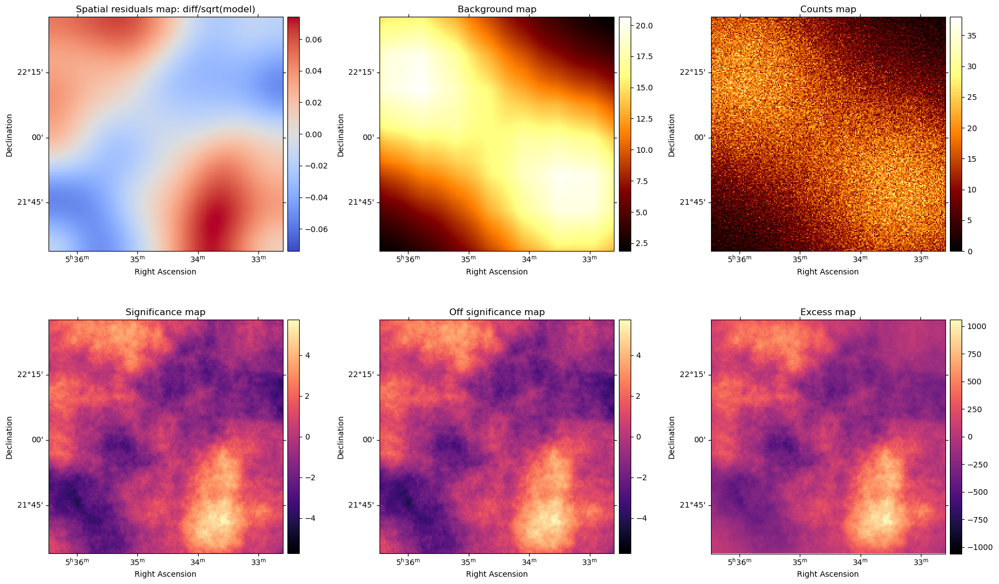

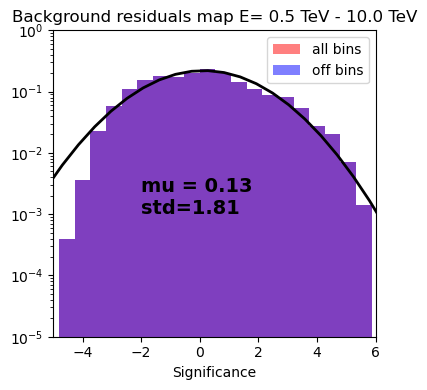

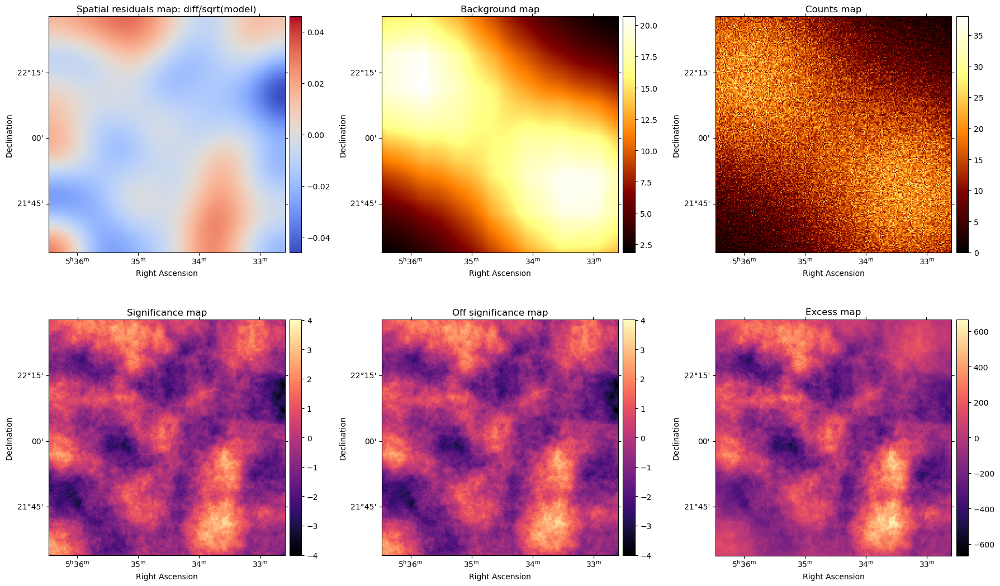

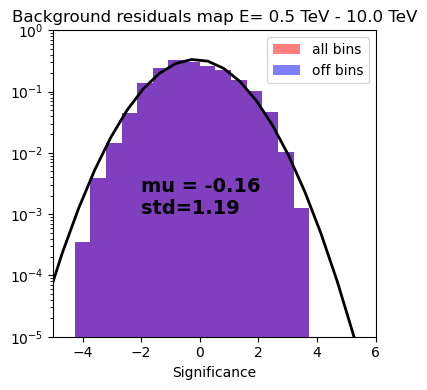

In [10]:
plot_skymaps  = True
axis_info = [pybkgmodel.e_min, pybkgmodel.e_max, 0.9*u.deg, pybkgmodel.nbin_offset_irf]
if plot_skymaps:
    pybkgmodel.load_observation_collection(from_index=True)
    stacked_dataset_pybkg_W1_W2 = pybkgmodel.get_stacked_dataset(bkg_method='FoV', axis_info=axis_info)
    sim.plot_lima_maps(stacked_dataset_pybkg_W1_W2, pybkgmodel.ring_bkg_param[0],pybkgmodel.source_pos,pybkgmodel.exclude_regions,pybkgmodel.exclu_rad,'',None,axis_info[:-1],cutout=True)
    stacked_dataset_pybkg_W1_W2 = pybkgmodel.get_stacked_dataset(bkg_method='ring', axis_info=axis_info)
    sim.plot_lima_maps(stacked_dataset_pybkg_W1_W2, pybkgmodel.ring_bkg_param[0],pybkgmodel.source_pos,pybkgmodel.exclude_regions,pybkgmodel.exclu_rad,'',None,axis_info[:-1],cutout=True)

acceptance: {'collection': True, 'cos_zenith_binning': {'cos_zenith_binning_method': 'min_livetime_per_wobble', 'cos_zenith_binning_parameter_value': 3000, 'initial_cos_zenith_binning': 0.01, 'runwise_normalisation': False, 'zenith_binning': False}, 'energy': {'e_max': 10, 'e_min': 0.5, 'nbin': 3, 'unit': 'TeV'}, 'fit': {'bounds': {'psi': [0, 0], 'x_cm': [0, 0], 'y_cm': [0, 0]}, 'fnc': 'bilinear_gaussian2d', 'minuit_print_level': 0}, 'method': 'stack', 'offset': {'nbin': 11, 'offset_max': 1.5}, 'single_file_path': '/fefs/aswg/workspace/ali.baktash/simulation_data/centered_full_gaussian/no_exlcusion/teststacked_exclusion_map.fits'}
background: {'maker': {'correlation_radius': 0.08, 'fov': {'method': 'scale'}, 'ring': {'internal_ring_radius': 0.1, 'width': 0.1}}, 'spatial_model': {'e': 0, 'lat_0': 0, 'lat_grad': 0, 'lat_grad_variation': False, 'lon_0': 0, 'lon_grad': 0, 'lon_grad_variation': False, 'model': 'GaussianSpatialModel_LinearGradient', 'phi': 0, 'sigma': 0.3, 'unit': 'deg'}, 's

INFO:gammapy.data.data_store:Observations selected: 12 out of 12.
INFO:acceptance_modelisation.base_acceptance_map_creator:Computation will be made with a bin size of 0.818 arcmin


Available sources:    OBJECT  
----------
model-simu
12 available runs:  [ 1  2  3  4  5  6  7  8  9 10 11 12]
Total simulated livetime: 2.0 h


/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/data/observations.py:357: GammapyDeprecationWarning: obs_info property is deprecated since v1.2. Use meta instead.
  warnings.warn(
/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/data/observations.py:93: GammapyDeprecationWarning: obs_info argument is deprecated since v1.2. Use meta instead.
  warnings.warn(


/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/data/observations.py:357: GammapyDeprecationWarning: obs_info property is deprecated since v1.2. Use meta instead.
  warnings.warn(
/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/data/observations.py:93: GammapyDeprecationWarning: obs_info argument is deprecated since v1.2. Use meta instead.
  warnings.warn(
/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/data/observations.py:357: GammapyDeprecationWarning: obs_info property is deprecated since v1.2. Use meta instead.
  warnings.warn(
/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/data/observations.py:93: GammapyDeprecationWarning: obs_info argument is deprecated since v1.2. Use meta instead.
  warnings.warn(
/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/data/observations.py:357

Obs collection loading pattern: _with_bkg_3d_stack_noexclusion_Ebins_3_offsetbins_11_offset_max_1.5
Available sources:    OBJECT  
----------
model-simu
12 available runs:  [ 1  2  3  4  5  6  7  8  9 10 11 12]
Total simulated livetime: 2.0 h


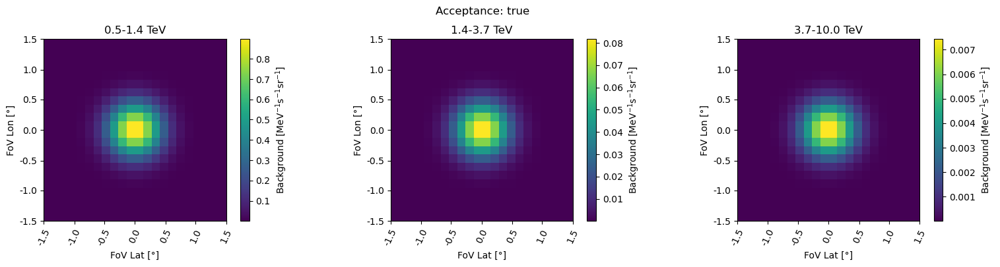

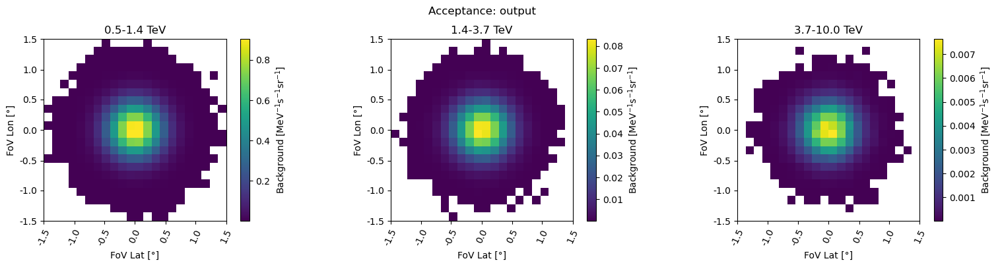

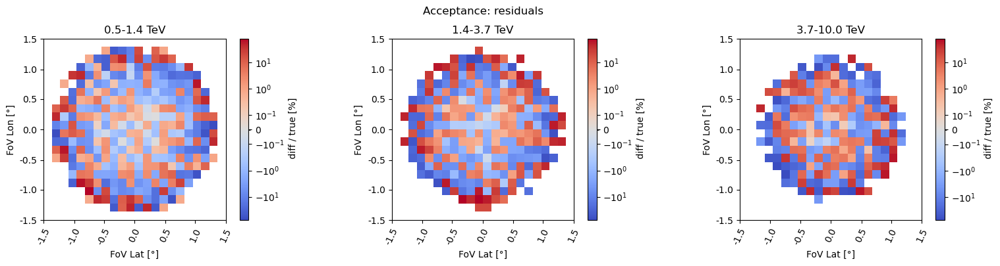

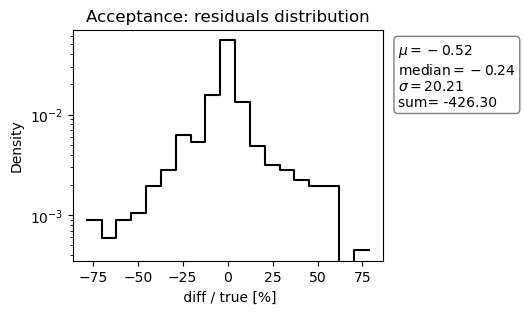

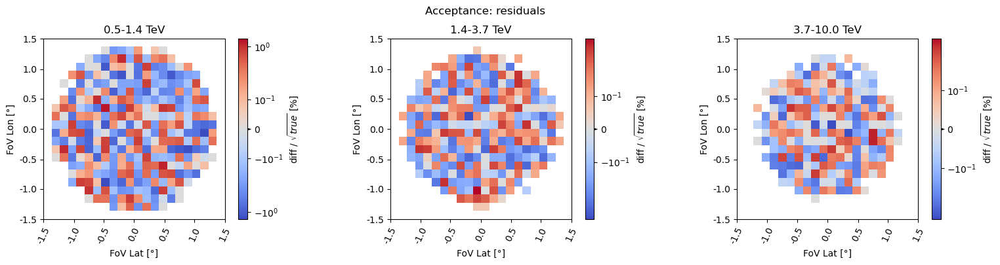

...

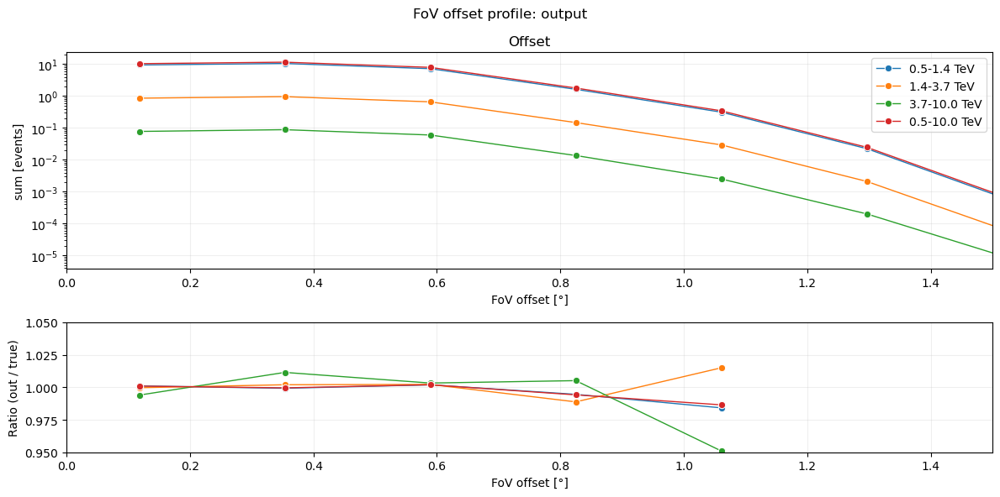

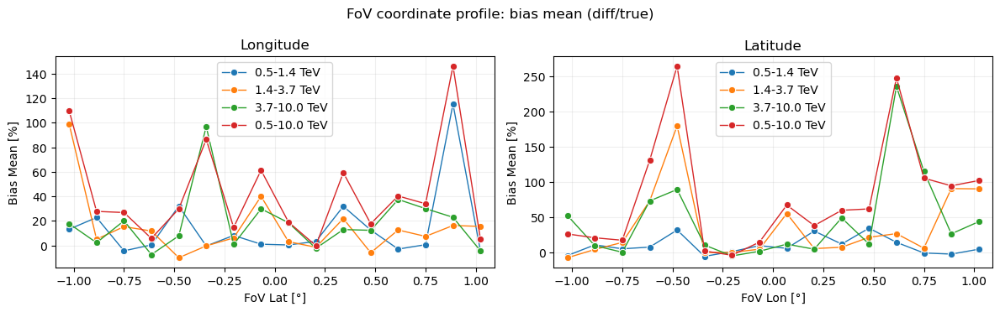

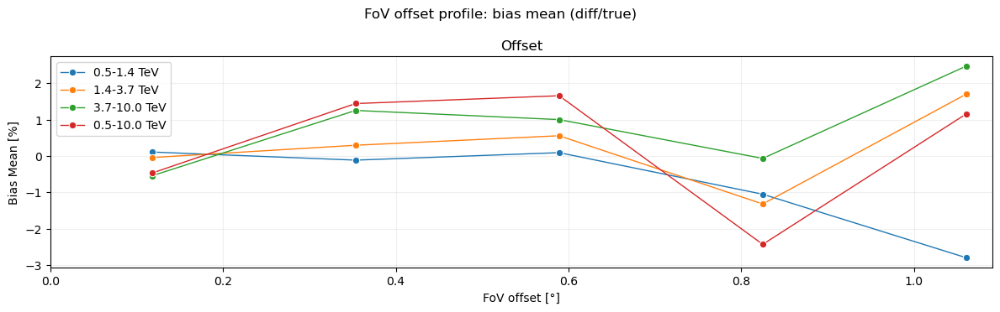

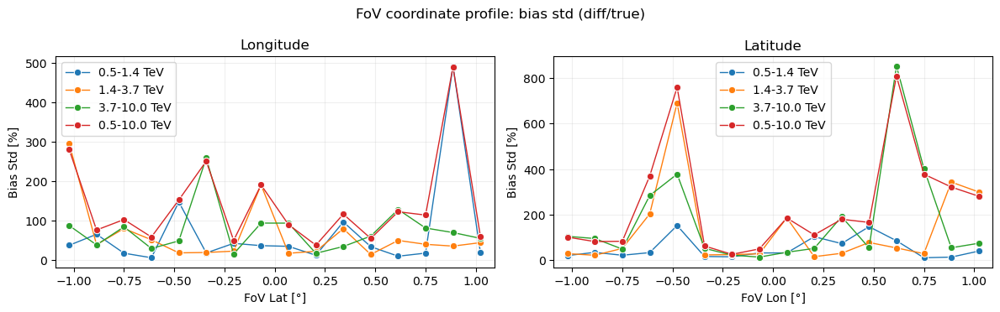

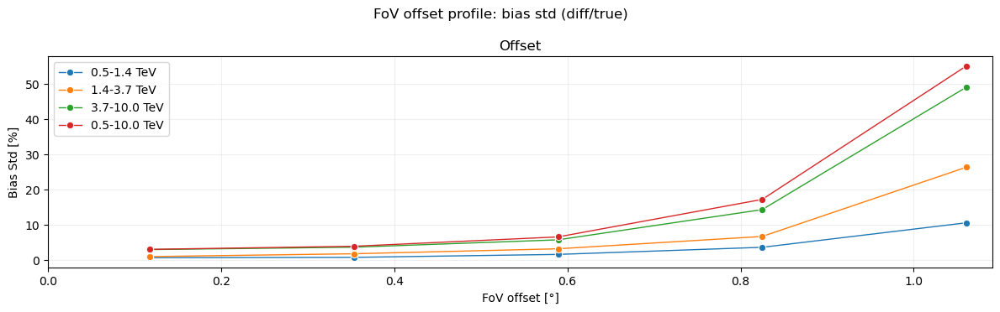

acceptance: {'collection': True, 'cos_zenith_binning': {'cos_zenith_binning_method': 'min_livetime_per_wobble', 'cos_zenith_binning_parameter_value': 3000, 'initial_cos_zenith_binning': 0.01, 'runwise_normalisation': False, 'zenith_binning': False}, 'energy': {'e_max': 10, 'e_min': 0.5, 'nbin': 3, 'unit': 'TeV'}, 'fit': {'bounds': {'psi': [0, 0], 'x_cm': [0, 0], 'y_cm': [0, 0]}, 'fnc': 'bilinear_gaussian2d', 'minuit_print_level': 0}, 'method': 'stack', 'offset': {'nbin': 11, 'offset_max': 1.5}, 'single_file_path': '/fefs/aswg/workspace/ali.baktash/simulation_data/centered_full_gaussian/no_exlcusion/teststacked_exclusion_map.fits'}
background: {'maker': {'correlation_radius': 0.08, 'fov': {'method': 'scale'}, 'ring': {'internal_ring_radius': 0.1, 'width': 0.1}}, 'spatial_model': {'e': 0, 'lat_0': 0, 'lat_grad': 0, 'lat_grad_variation': False, 'lon_0': 0, 'lon_grad': 0, 'lon_grad_variation': False, 'model': 'GaussianSpatialModel_LinearGradient', 'phi': 0, 'sigma': 0.3, 'unit': 'deg'}, 's

INFO:gammapy.data.data_store:Observations selected: 12 out of 12.


Available sources:    OBJECT  
----------
model-simu
12 available runs:  [ 1  2  3  4  5  6  7  8  9 10 11 12]
Total simulated livetime: 2.0 h
FoV background method is applied
mu =  -0.15710954452407477  std=  1.8159007224106365
Ring background method is applied


/fefs/aswg/workspace/marie-sophie.carrasco/miniconda3/envs/gammapy-dev_ge/lib/python3.11/site-packages/astropy/units/quantity.py:671: RuntimeWarning: invalid value encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/stats/counts_statistic.py:399: RuntimeWarning: invalid value encountered in multiply
  return self.alpha * self.n_off
/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/stats/fit_statistics.py:208: RuntimeWarning: invalid value encountered in multiply
  C = alpha * (n_on + n_off) - (1 + alpha) * mu_sig
/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/stats/fit_statistics.py:209: RuntimeWarning: invalid value encountered in multiply
  D = np.sqrt(C**2 + 4 * alpha * (alpha + 1) * n_off * mu_sig)


mu =  -0.23064428015859087  std=  1.152552830657772


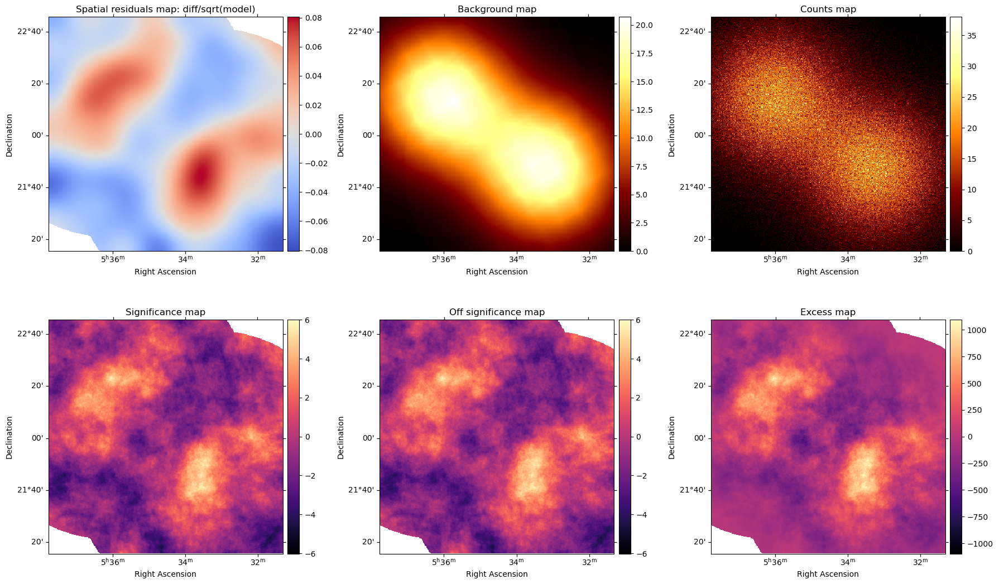

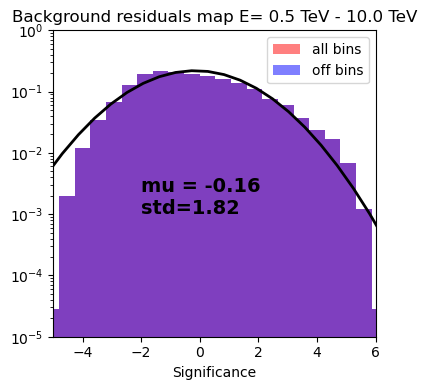

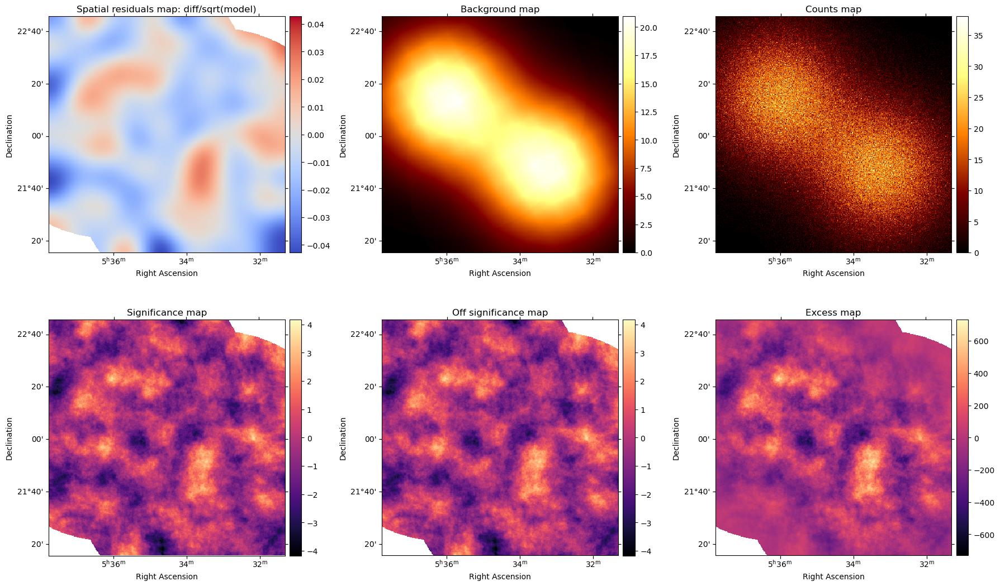

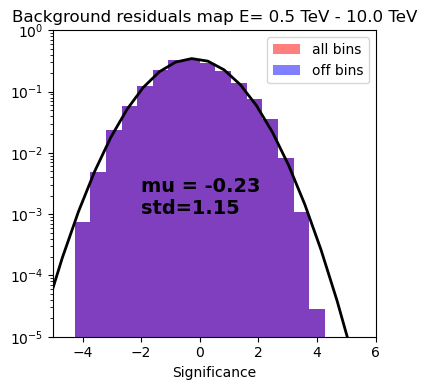

In [11]:
# Change any parameter you need for the modeling in the config file
tmp_config["acceptance"]["method"] = 'stack'
with open(path_tmp_config, 'w') as file: yaml.dump(tmp_config, file)

do_accmodel = True
if do_accmodel: accmodel.do_acceptance_modelisation(path_tmp_config)
else: 
    accmodel.load_output_background_irfs(path_tmp_config)

# If you want a direct check of the model
# if accmodel.out_collection: accmodel.bkg_output_irf_collection[1].plot_at_energy(["1 TeV"],figsize=(3,3))
# else: accmodel.bkg_output_irf.plot_at_energy(["1 TeV"],figsize=(3,3))

# TO-DO: re-implement zenith binned plotting within plot_method
icos='all'
# Uncomment if you want every model plotted
accmodel.plot(data='acceptance', irf='true', residuals='none',title="Acceptance: true", fig_save_path=f"{accmodel.plots_dir}/acceptance_true_cosbin_{icos}.png")
accmodel.plot(data='acceptance', irf='output', residuals='none',title="Acceptance: output", fig_save_path=f"{accmodel.plots_dir}/acceptance_out_cosbin_{icos}.png")
accmodel.plot(data='acceptance', irf='both', residuals='diff/true',title="Acceptance: residuals", fig_save_path=f"{accmodel.plots_dir}/acceptance_residuals_cosbin_{icos}.png", plot_hist=True)
accmodel.plot(data='acceptance', irf='both', residuals='diff/sqrt(true)', title="Acceptance: residuals", fig_save_path=f"{accmodel.plots_dir}/acceptance_residuals_sqrt_cosbin_{icos}.png")

accmodel.plot_profile(irf='output', profile='both', stat='sum', bias=False, ratio_lim=[0.95,1.05], all_Ebins=True, fig_save_path=f"{accmodel.plots_dir}/profile_stat_sum_cosbin_{icos}.png")
accmodel.plot_profile(irf='both', profile='both', stat='mean', bias=True, ratio_lim=[0.95,1.05], all_Ebins=True, fig_save_path=f"{accmodel.plots_dir}/profile_bias_mean_cosbin_{icos}.png")
accmodel.plot_profile(irf='both', profile='both', stat='std', bias=True, ratio_lim=[0.95,1.05], all_Ebins=True, fig_save_path=f"{accmodel.plots_dir}/profile_bias_std_cosbin_{icos}.png")

plot_skymaps  = True
if plot_skymaps:
    accmodel.load_observation_collection(path_tmp_config, from_index=True)
    
    e_min_map, e_max_map, nbin_offset_map = (accmodel.e_min, accmodel.e_max, accmodel.nbin_offset_irf)
    axis_info_dataset = [e_min_map, e_max_map, 0.9*u.deg, nbin_offset_map]
    axis_info_map = [e_min_map, e_max_map, accmodel.size_fov_acc, nbin_offset_map]

    stacked_dataset_simu_W1_W2 = accmodel.get_stacked_dataset(bkg_method='FoV', axis_info=axis_info_dataset)
    sim.plot_lima_maps(stacked_dataset_simu_W1_W2, accmodel.ring_bkg_param[0],accmodel.source_pos,accmodel.exclude_regions,accmodel.exclu_rad,'',None,axis_info_map[:-1],cutout=True)
    
    stacked_dataset_simu_W1_W2 = accmodel.get_stacked_dataset(bkg_method='ring', axis_info=axis_info_dataset)
    sim.plot_lima_maps(stacked_dataset_simu_W1_W2, accmodel.ring_bkg_param[0],accmodel.source_pos,accmodel.exclude_regions,accmodel.exclu_rad,'',None,axis_info_map[:-1],cutout=True)

acceptance: {'collection': True, 'cos_zenith_binning': {'cos_zenith_binning_method': 'min_livetime_per_wobble', 'cos_zenith_binning_parameter_value': 3000, 'initial_cos_zenith_binning': 0.01, 'runwise_normalisation': False, 'zenith_binning': False}, 'energy': {'e_max': 10, 'e_min': 0.5, 'nbin': 3, 'unit': 'TeV'}, 'fit': {'bounds': {'psi': [0, 0], 'x_cm': [0, 0], 'y_cm': [0, 0]}, 'fnc': 'bilinear_gaussian2d', 'minuit_print_level': 0}, 'method': 'fit', 'offset': {'nbin': 11, 'offset_max': 1.5}, 'single_file_path': '/fefs/aswg/workspace/ali.baktash/simulation_data/centered_full_gaussian/no_exlcusion/teststacked_exclusion_map.fits'}
background: {'maker': {'correlation_radius': 0.08, 'fov': {'method': 'scale'}, 'ring': {'internal_ring_radius': 0.1, 'width': 0.1}}, 'spatial_model': {'e': 0, 'lat_0': 0, 'lat_grad': 0, 'lat_grad_variation': False, 'lon_0': 0, 'lon_grad': 0, 'lon_grad_variation': False, 'model': 'GaussianSpatialModel_LinearGradient', 'phi': 0, 'sigma': 0.3, 'unit': 'deg'}, 'spe

INFO:gammapy.data.data_store:Observations selected: 12 out of 12.
INFO:acceptance_modelisation.base_acceptance_map_creator:Computation will be made with a bin size of 0.818 arcmin


Available sources:    OBJECT  
----------
model-simu
12 available runs:  [ 1  2  3  4  5  6  7  8  9 10 11 12]
Total simulated livetime: 2.0 h


/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/data/observations.py:357: GammapyDeprecationWarning: obs_info property is deprecated since v1.2. Use meta instead.
  warnings.warn(
/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/data/observations.py:93: GammapyDeprecationWarning: obs_info argument is deprecated since v1.2. Use meta instead.
  warnings.warn(
/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/data/observations.py:357: GammapyDeprecationWarning: obs_info property is deprecated since v1.2. Use meta instead.
  warnings.warn(
/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/data/observations.py:93: GammapyDeprecationWarning: obs_info argument is deprecated since v1.2. Use meta instead.
  warnings.warn(
/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/data/observations.py:357

Obs collection loading pattern: _with_bkg_3d_fit_noexclusion_Ebins_3_offsetbins_11_offset_max_1.5
Available sources:    OBJECT  
----------
model-simu
12 available runs:  [ 1  2  3  4  5  6  7  8  9 10 11 12]
Total simulated livetime: 2.0 h


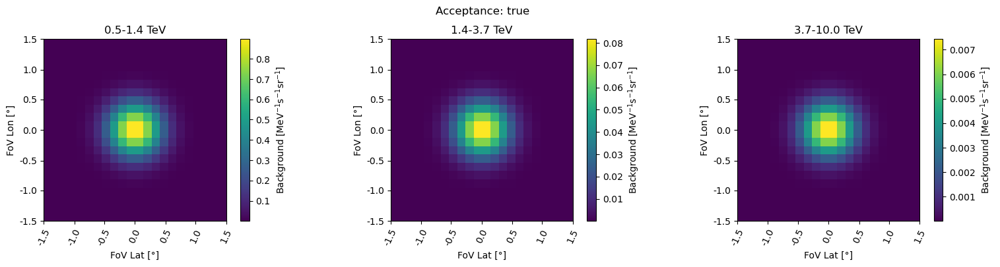

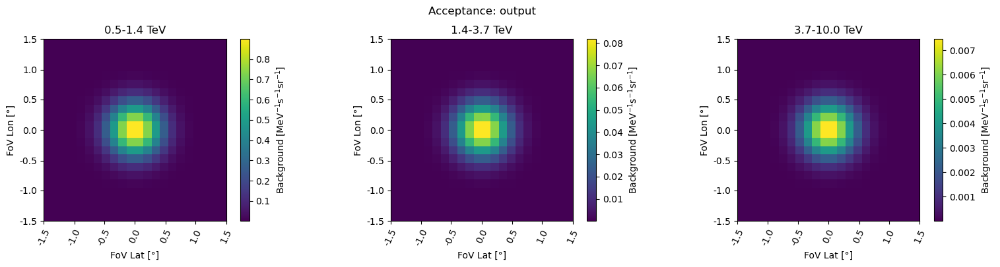

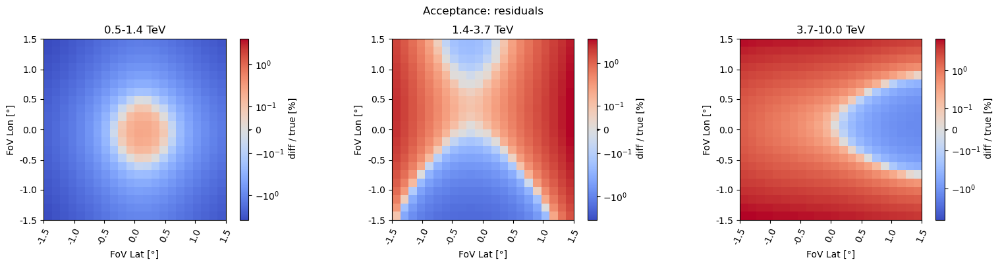

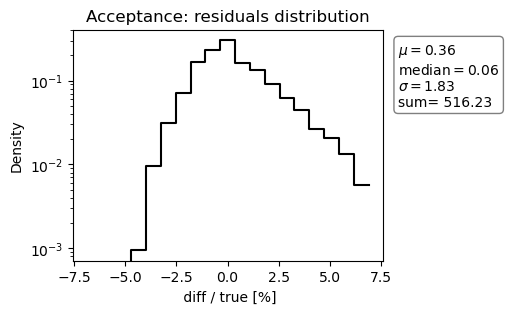

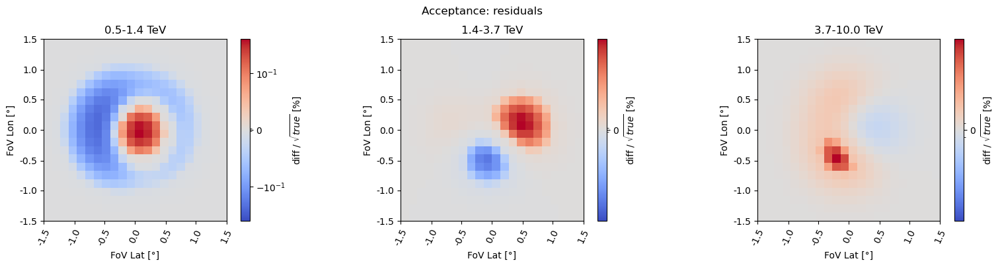

...

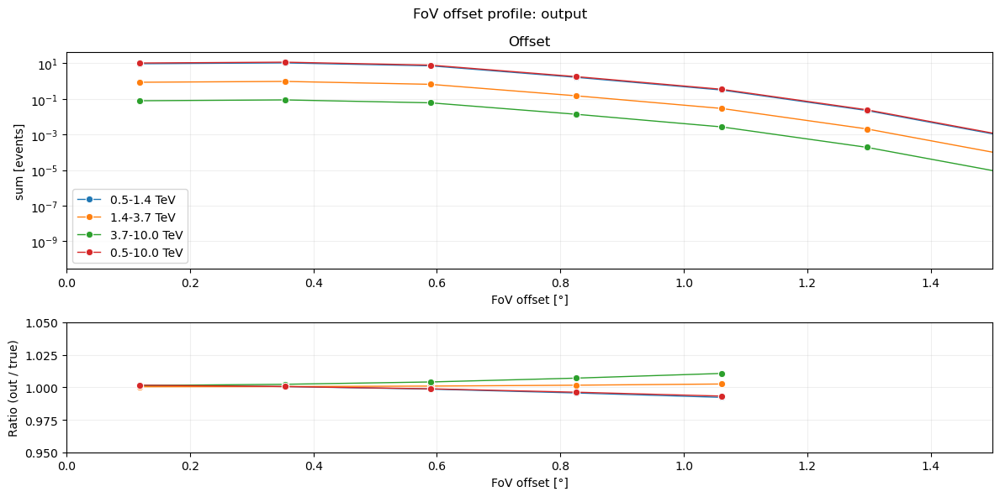

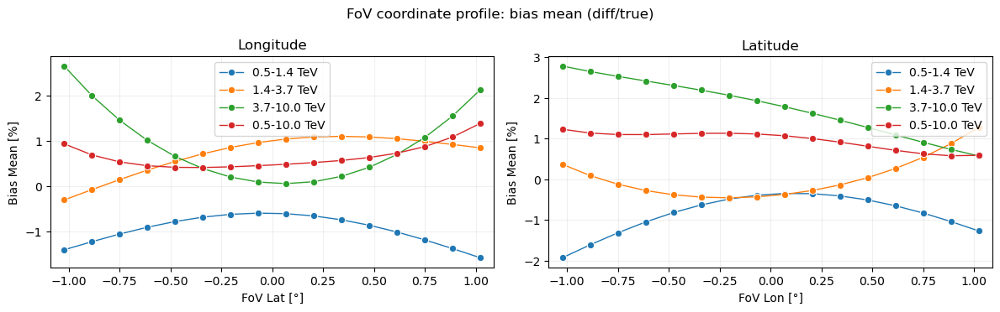

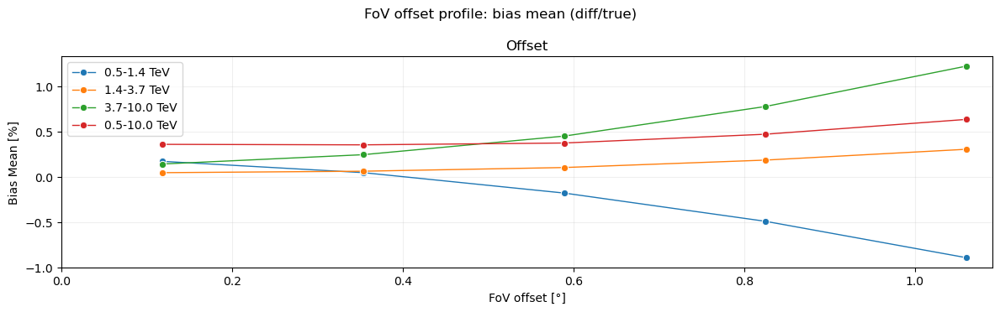

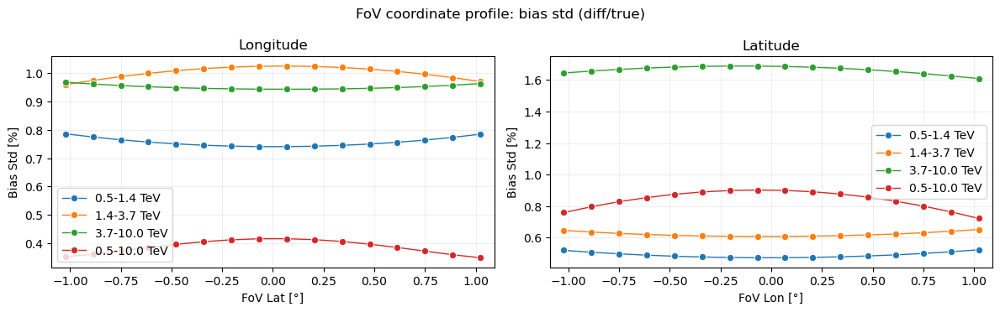

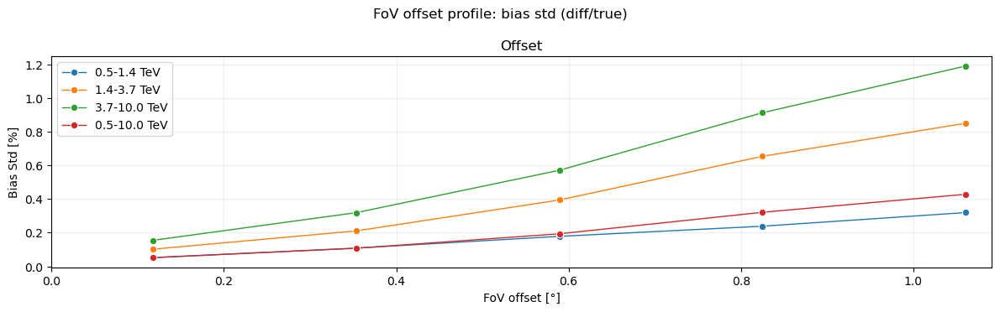

acceptance: {'collection': True, 'cos_zenith_binning': {'cos_zenith_binning_method': 'min_livetime_per_wobble', 'cos_zenith_binning_parameter_value': 3000, 'initial_cos_zenith_binning': 0.01, 'runwise_normalisation': False, 'zenith_binning': False}, 'energy': {'e_max': 10, 'e_min': 0.5, 'nbin': 3, 'unit': 'TeV'}, 'fit': {'bounds': {'psi': [0, 0], 'x_cm': [0, 0], 'y_cm': [0, 0]}, 'fnc': 'bilinear_gaussian2d', 'minuit_print_level': 0}, 'method': 'fit', 'offset': {'nbin': 11, 'offset_max': 1.5}, 'single_file_path': '/fefs/aswg/workspace/ali.baktash/simulation_data/centered_full_gaussian/no_exlcusion/teststacked_exclusion_map.fits'}
background: {'maker': {'correlation_radius': 0.08, 'fov': {'method': 'scale'}, 'ring': {'internal_ring_radius': 0.1, 'width': 0.1}}, 'spatial_model': {'e': 0, 'lat_0': 0, 'lat_grad': 0, 'lat_grad_variation': False, 'lon_0': 0, 'lon_grad': 0, 'lon_grad_variation': False, 'model': 'GaussianSpatialModel_LinearGradient', 'phi': 0, 'sigma': 0.3, 'unit': 'deg'}, 'spe

INFO:gammapy.data.data_store:Observations selected: 12 out of 12.


Available sources:    OBJECT  
----------
model-simu
12 available runs:  [ 1  2  3  4  5  6  7  8  9 10 11 12]
Total simulated livetime: 2.0 h
FoV background method is applied
mu =  -0.2215087799554939  std=  1.46885532830567
Ring background method is applied


/fefs/aswg/workspace/marie-sophie.carrasco/miniconda3/envs/gammapy-dev_ge/lib/python3.11/site-packages/astropy/units/quantity.py:671: RuntimeWarning: invalid value encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/stats/counts_statistic.py:399: RuntimeWarning: invalid value encountered in multiply
  return self.alpha * self.n_off
/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/stats/fit_statistics.py:208: RuntimeWarning: invalid value encountered in multiply
  C = alpha * (n_on + n_off) - (1 + alpha) * mu_sig
/fefs/aswg/workspace/marie-sophie.carrasco/projects/dev-github/gammapy/gammapy_ge/gammapy/stats/fit_statistics.py:209: RuntimeWarning: invalid value encountered in multiply
  D = np.sqrt(C**2 + 4 * alpha * (alpha + 1) * n_off * mu_sig)


mu =  -0.2510495238182489  std=  0.9389531966139915


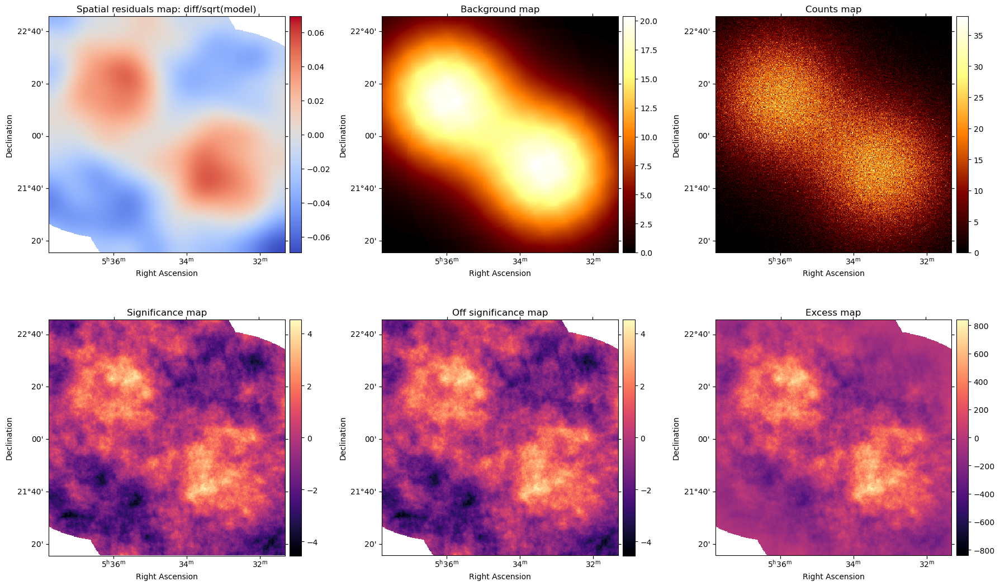

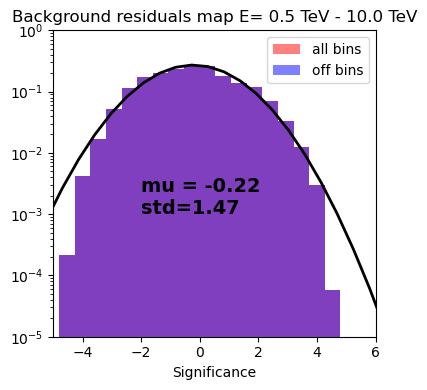

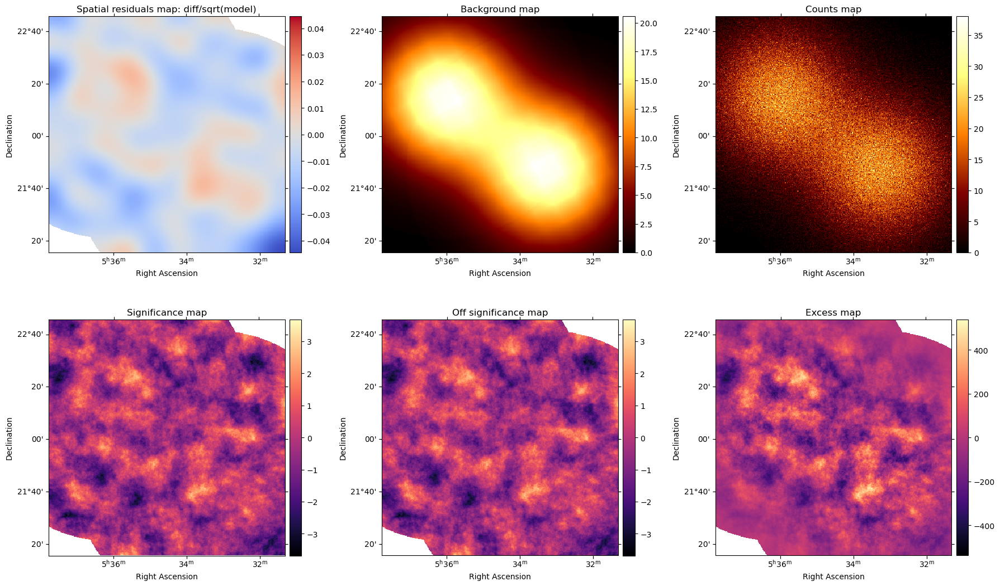

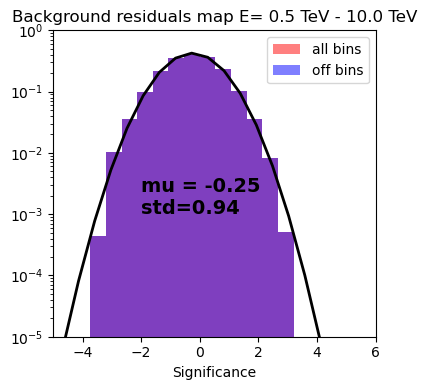

In [12]:
# Change any parameter you need for the modeling in the config file
tmp_config["acceptance"]["method"] = 'fit'
with open(path_tmp_config, 'w') as file: yaml.dump(tmp_config, file)

do_accmodel = True
if do_accmodel: accmodel.do_acceptance_modelisation(path_tmp_config)
else: 
    accmodel.load_output_background_irfs(path_tmp_config)

# If you want a direct check of the model
# if accmodel.out_collection: accmodel.bkg_output_irf_collection[1].plot_at_energy(["1 TeV"],figsize=(3,3))
# else: accmodel.bkg_output_irf.plot_at_energy(["1 TeV"],figsize=(3,3))

# TO-DO: re-implement zenith binned plotting within plot_method
icos='all'
# Uncomment if you want every model plotted
accmodel.plot(data='acceptance', irf='true', residuals='none',title="Acceptance: true", fig_save_path=f"{accmodel.plots_dir}/acceptance_true_cosbin_{icos}.png")
accmodel.plot(data='acceptance', irf='output', residuals='none',title="Acceptance: output", fig_save_path=f"{accmodel.plots_dir}/acceptance_out_cosbin_{icos}.png")
accmodel.plot(data='acceptance', irf='both', residuals='diff/true',title="Acceptance: residuals", fig_save_path=f"{accmodel.plots_dir}/acceptance_residuals_cosbin_{icos}.png", plot_hist=True)
accmodel.plot(data='acceptance', irf='both', residuals='diff/sqrt(true)', title="Acceptance: residuals", fig_save_path=f"{accmodel.plots_dir}/acceptance_residuals_sqrt_cosbin_{icos}.png")

accmodel.plot_profile(irf='output', profile='both', stat='sum', bias=False, ratio_lim=[0.95,1.05], all_Ebins=True, fig_save_path=f"{accmodel.plots_dir}/profile_stat_sum_cosbin_{icos}.png")
accmodel.plot_profile(irf='both', profile='both', stat='mean', bias=True, ratio_lim=[0.95,1.05], all_Ebins=True, fig_save_path=f"{accmodel.plots_dir}/profile_bias_mean_cosbin_{icos}.png")
accmodel.plot_profile(irf='both', profile='both', stat='std', bias=True, ratio_lim=[0.95,1.05], all_Ebins=True, fig_save_path=f"{accmodel.plots_dir}/profile_bias_std_cosbin_{icos}.png")

plot_skymaps  = True
if plot_skymaps:
    accmodel.load_observation_collection(path_tmp_config, from_index=True)
    
    e_min_map, e_max_map, nbin_offset_map = (accmodel.e_min, accmodel.e_max, accmodel.nbin_offset_irf)
    axis_info_dataset = [e_min_map, e_max_map, 0.9*u.deg, nbin_offset_map]
    axis_info_map = [e_min_map, e_max_map, accmodel.size_fov_acc, nbin_offset_map]

    stacked_dataset_simu_W1_W2 = accmodel.get_stacked_dataset(bkg_method='FoV', axis_info=axis_info_dataset)
    sim.plot_lima_maps(stacked_dataset_simu_W1_W2, accmodel.ring_bkg_param[0],accmodel.source_pos,accmodel.exclude_regions,accmodel.exclu_rad,'',None,axis_info_map[:-1],cutout=True)
    
    stacked_dataset_simu_W1_W2 = accmodel.get_stacked_dataset(bkg_method='ring', axis_info=axis_info_dataset)
    sim.plot_lima_maps(stacked_dataset_simu_W1_W2, accmodel.ring_bkg_param[0],accmodel.source_pos,accmodel.exclude_regions,accmodel.exclu_rad,'',None,axis_info_map[:-1],cutout=True)

# Skymaps

acceptance: {'collection': True, 'cos_zenith_binning': {'cos_zenith_binning_method': 'min_livetime_per_wobble', 'cos_zenith_binning_parameter_value': 3000, 'initial_cos_zenith_binning': 0.01, 'runwise_normalisation': False, 'zenith_binning': False}, 'energy': {'e_max': 10, 'e_min': 0.5, 'nbin': 3, 'unit': 'TeV'}, 'fit': {'bounds': {'psi': [0, 0], 'x_cm': [0, 0], 'y_cm': [0, 0]}, 'fnc': 'bilinear_gaussian2d', 'minuit_print_level': 0}, 'method': 'fit', 'offset': {'nbin': 11, 'offset_max': 1.5}, 'single_file_path': '/fefs/aswg/workspace/ali.baktash/simulation_data/centered_full_gaussian/no_exlcusion/teststacked_exclusion_map.fits'}
background: {'maker': {'correlation_radius': 0.08, 'fov': {'method': 'scale'}, 'ring': {'internal_ring_radius': 0.1, 'width': 0.1}}, 'spatial_model': {'e': 0, 'lat_0': 0, 'lat_grad': 0, 'lat_grad_variation': False, 'lon_0': 0, 'lon_grad': 0, 'lon_grad_variation': False, 'model': 'GaussianSpatialModel_LinearGradient', 'phi': 0, 'sigma': 0.3, 'unit': 'deg'}, 'spe

INFO:gammapy.data.data_store:Observations selected: 12 out of 12.


--Run 11895--
livetime: 1123.715198168754
pointing radec: <SkyCoord (ICRS): (ra, dec) in deg
    (83.30629898, 21.78868177)>
pointing altaz: <AltAz Coordinate (obstime=None, location=(5327448.995782899, -1718665.738695689, 3051566.9029540345) m, pressure=0.0 hPa, temperature=0.0 deg_C, relative_humidity=0.0, obswl=1.0 micron): (az, alt) in deg
    (281.98039037, 25.52910292)>
--Run 11896--
livetime: 842.2237329621282
pointing radec: <SkyCoord (ICRS): (ra, dec) in deg
    (84.01767936, 22.25026938)>
pointing altaz: <AltAz Coordinate (obstime=None, location=(5327448.995782899, -1718665.738695689, 3051566.9029540345) m, pressure=0.0 hPa, temperature=0.0 deg_C, relative_humidity=0.0, obswl=1.0 micron): (az, alt) in deg
    (283.90006769, 22.54733861)>
Total simulated livetime: 2.0 h
acceptance files:  /fefs/aswg/workspace/marie-sophie.carrasco/projects/analysis/simulation/outputs/tests/data/datasets/elliptical_bkg_x_0_y_0_sig_03_phi_0_e_0_xgrad_0_ygrad_0/n_run_obs_per_wobble_delay_600_norm

Ring background method is applied
mu =  -0.19503216199073525  std=  0.9903119030199852


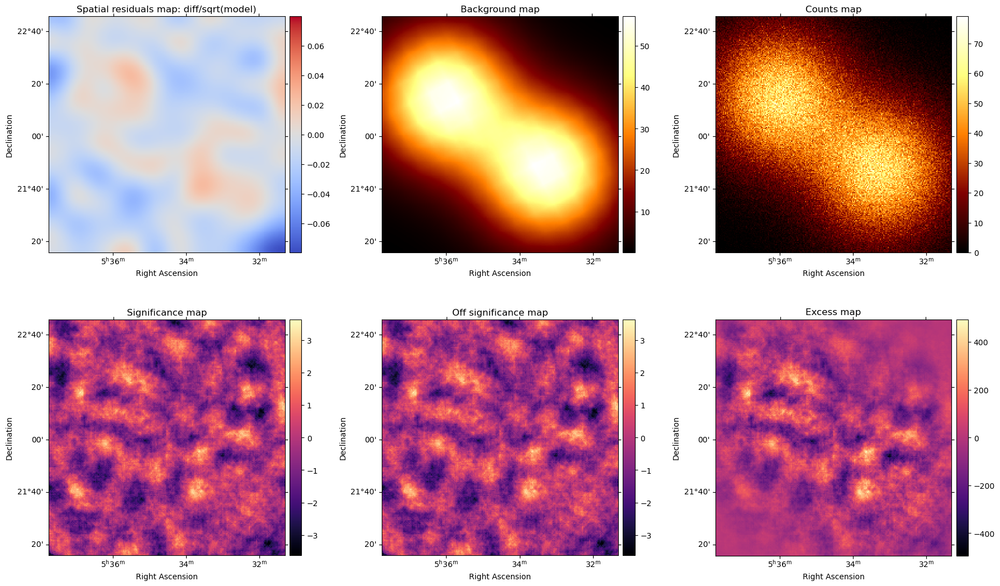

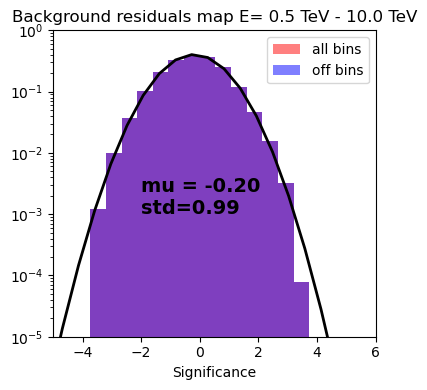

[0.5 1.4]
Ring background method is applied
mu =  -0.19503216199073525  std=  0.9903119030199852


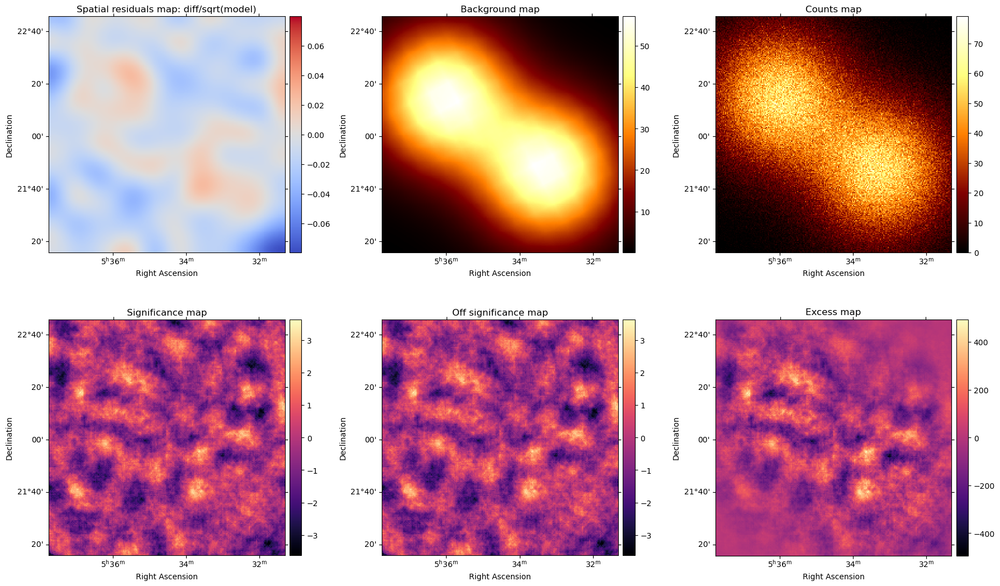

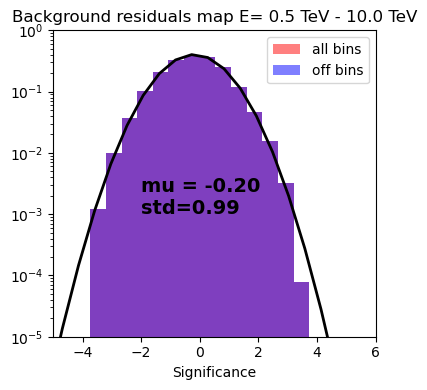

[1.4 3.7]
Ring background method is applied
mu =  -0.19503216199073525  std=  0.9903119030199852


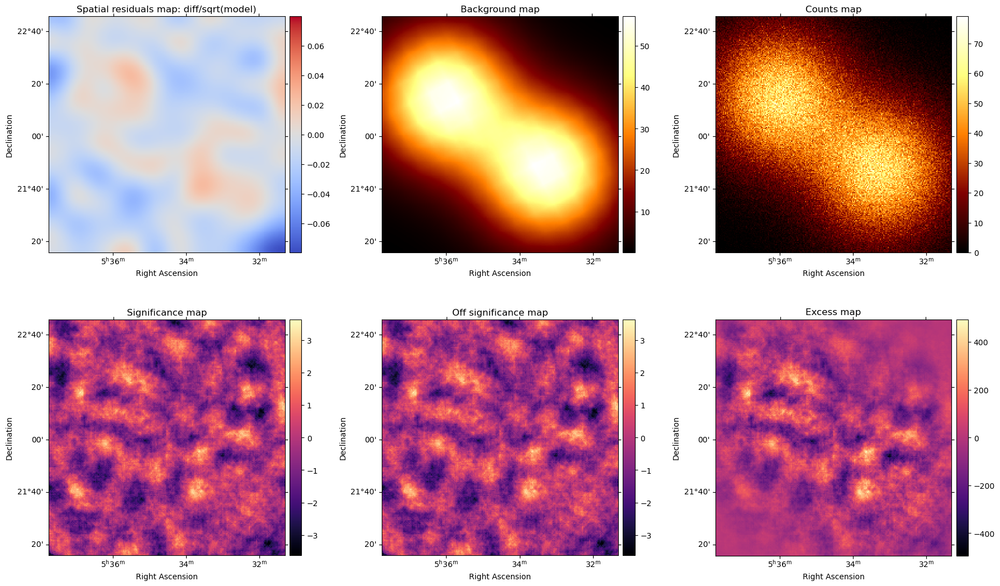

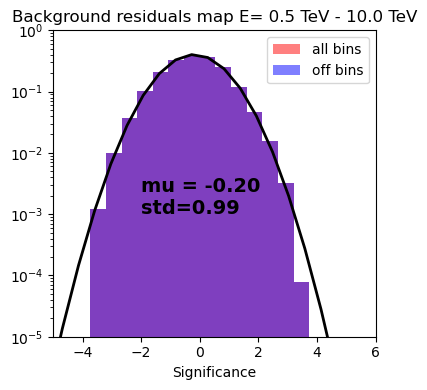

[ 3.7 10. ]
Ring background method is applied
mu =  -0.19503216199073525  std=  0.9903119030199852


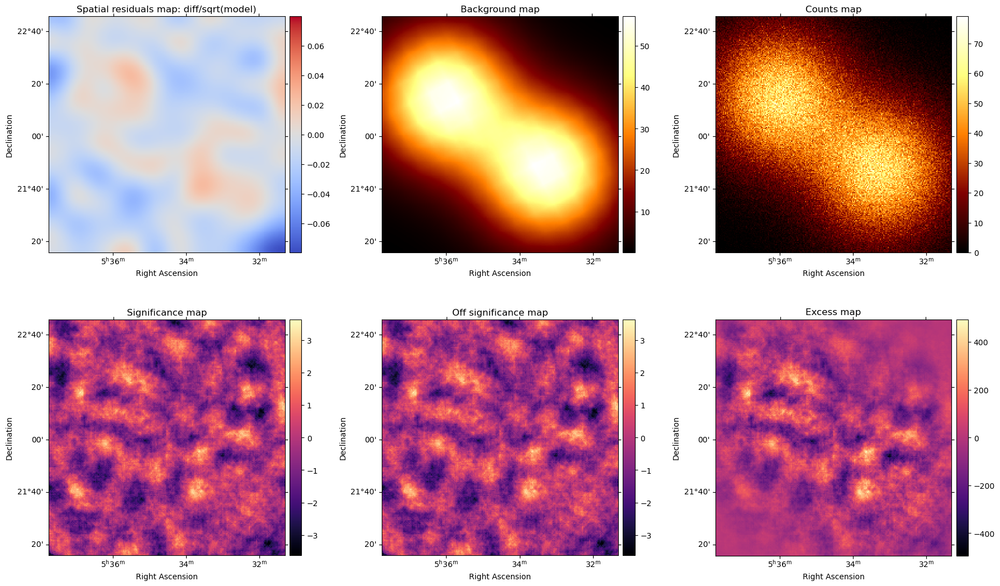

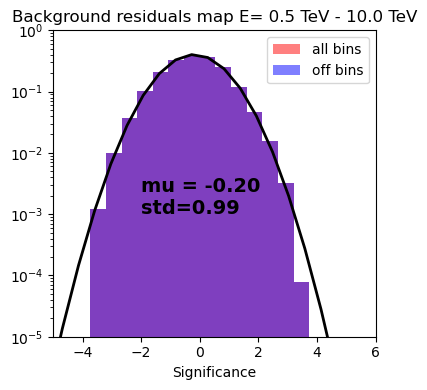

In [16]:
# Example of plotting skymaps for various energy bins

tmp_config["acceptance"]["method"] = 'fit'
# tmp_config["background"]["maker"]["fov"]["method"] = 'scale'

with open(path_tmp_config, 'w') as file: yaml.dump(tmp_config, file)

plot_skymaps = True
if plot_skymaps:
    accmodel.load_observation_collection(path_tmp_config, from_index=True) 
    # If you set from_index to False or accmodel.index_suffix to empty string '', the obs collection is loaded with the simulation model
    # If you have your own index tables, put them in the simulation directory and set the accmodel.index_suffix accordingly
    
    e_min_map, e_max_map, nbin_offset_map = (accmodel.e_min, accmodel.e_max, accmodel.nbin_offset_irf)
    axis_info_dataset = [e_min_map, e_max_map,  accmodel.size_fov_acc, nbin_offset_map]
    axis_info_map = [e_min_map, e_max_map, accmodel.size_fov_acc.value, nbin_offset_map]

    ebins_plot_edges=accmodel.energy_axis_acceptance.edges.value
    ebins_plot = np.concatenate(([np.round([ebins_plot_edges[0],ebins_plot_edges[-1]],1)],np.round(np.array([(edge_inf,edge_sup) for edge_inf,edge_sup in zip(ebins_plot_edges[:-1],ebins_plot_edges[1:])]),1)))

    for emap_minmax in ebins_plot:
        print(emap_minmax)
        plot_name=f'{accmodel.source_name}_{accmodel.method}_ring_rad_int_{accmodel.exclu_rad+accmodel.ring_bkg_param[0]:.2f}_width_{accmodel.ring_bkg_param[1]:.2f}_corr_rad_{accmodel.correlation_radius}_e_minmax_{emap_minmax[0]}_{emap_minmax[1]}'
        stacked_dataset_accmodel_W1_W2_Ebin = accmodel.get_stacked_dataset(bkg_method='ring', axis_info=axis_info_dataset)
        sim.plot_lima_maps(stacked_dataset_accmodel_W1_W2_Ebin, accmodel.correlation_radius,accmodel.source_pos,accmodel.exclude_regions,accmodel.exclu_rad,'ring',accmodel.ring_bkg_param,axis_info_map[:-1],cutout=True)

        plt.show()